## Importing all the necessary libraries

In [1]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image
from torchvision import models
import torch.nn as nn

import os
import random

## Loading fine-tuned model

In [2]:
# Selecting the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

# Loading saved model
model = models.efficientnet_b0()
model.classifier[1] = nn.Linear(model.classifier[1].in_features, 5)
model.load_state_dict(torch.load("best_model.pth"))
model.to(device)
model.eval()

cuda


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

## Implementation of Grad-CAM

In [3]:
def grad_cam(model, img_tensor, target_class, orig_size=(224, 224), last_conv=model.features[-1]):
    # Swithing model to the evaluation mode
    model.eval()
    
    # Moving model and input tensor to the same device
    device = next(model.parameters()).device
    img_tensor = img_tensor.to(device).unsqueeze(0)

    # For tracking gradients
    img_tensor.requires_grad_(True)

    # Getting the last convolutional layer
    last_conv_layer = last_conv
    
    # Storing gradients and activations
    gradients = []
    activations = []

    def backward_hook(module, grad_input, grad_output):
        gradients.append(grad_output[0].detach())

    def forward_hook(module, input, output):
        activations.append(output.detach())

    # Registering hooks to get activations and gradients
    hook_b = last_conv_layer.register_backward_hook(backward_hook)
    hook_f = last_conv_layer.register_forward_hook(forward_hook)

    # Forward pass
    output = model(img_tensor)
    
    # Zeroing gradients and backward passing for the target class
    model.zero_grad()
    one_hot = torch.zeros_like(output)
    one_hot[0, target_class] = 1
    output.backward(gradient=one_hot)

    # Computing Grad-CAM
    weights = torch.mean(gradients[0], dim=[2, 3], keepdim=True)    # Using global average pooling
    cam = torch.sum(weights * activations[0], dim=1, keepdim=True)
    cam = torch.relu(cam)
    
    # Resizing and normalizing
    cam = torch.nn.functional.interpolate(
        cam, size=orig_size, mode="bilinear", align_corners=False
    )
    
    # Moving to CPU for visualization
    cam = cam.squeeze().cpu().numpy()
    # Normalizing to [0, 1]
    cam = (cam - cam.min()) / (cam.max() - cam.min())

    # Removing hooks
    hook_b.remove()
    hook_f.remove()

    return cam

## Testing Grad-CAM

C:\Users\Макар\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\torch\nn\modules\module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)
C:\Users\Макар\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\torch\autograd\graph.py:823: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\cuda\CublasHandlePool.cpp:180.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the bac

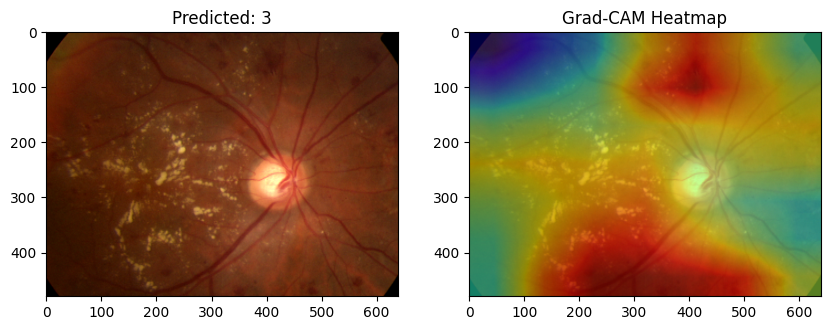

In [4]:
# Loading a test image
test_img_path = "data/aptos2019/test_images/0a2b5e1a0be8.png"
img = Image.open(test_img_path)
img_size = img.size[::-1]

# Preprocessing
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
img_tensor = transform(img).to(device).unsqueeze(0)

# Predicting class
with torch.no_grad():
    output = model(img_tensor)
    pred_class = torch.argmax(output).item()

# Generating Grad-CAM heatmap
# Last convolution layer for EfficientNetB0 is features[8][0]
last_conv=model.features[8][0]
heatmap = grad_cam(model, img_tensor.squeeze(0), pred_class, img_size, last_conv)

# Visualizing
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title(f"Predicted: {pred_class}")

plt.subplot(1, 2, 2)
plt.imshow(img)
plt.imshow(heatmap, cmap="jet", alpha=0.5)
plt.title("Grad-CAM Heatmap")
plt.show()

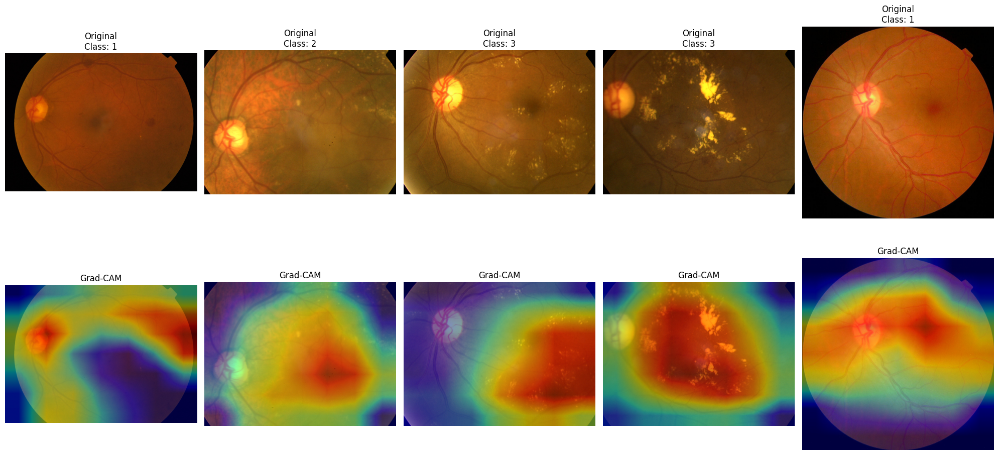

In [5]:
image_dir = "data/aptos2019/test_images"
all_images = os.listdir(image_dir)
# Taking 5 random images
selected_images = random.sample(all_images, 5)

# Plotting predictions and Grad-CAM
plt.figure(figsize=(20, 10))

for i, img_name in enumerate(selected_images):
    # Loading image
    img_path = os.path.join(image_dir, img_name)
    img = Image.open(img_path)
    img_size = img.size[::-1]
    
    # Preprocessing and predicting
    img_tensor = transform(img).to(device).unsqueeze(0)
    with torch.no_grad():
        output = model(img_tensor)
        pred_class = torch.argmax(output).item()
    
    # Generating Grad-CAM heatmap
    last_conv=model.features[8][0]
    heatmap = grad_cam(model, img_tensor.squeeze(0), pred_class, img_size, last_conv)
    
    # Plotting original and overlayed images
    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.title(f"Original\nClass: {pred_class}")
    plt.axis('off')
    
    plt.subplot(2, 5, i+6)
    plt.imshow(img)
    plt.imshow(heatmap, cmap="jet", alpha=0.5)
    plt.title("Grad-CAM")
    plt.axis('off')

plt.tight_layout()
plt.show()

## Implementation of Grad-CAM++

In [6]:
def grad_cam_plusplus(model, img_tensor, target_class, orig_size=(224, 224), last_conv=model.features[-1]):
    # Swithing model to the evaluation mode
    model.eval()
    
    # Moving model and input tensor to the same device
    device = next(model.parameters()).device
    img_tensor = img_tensor.to(device).unsqueeze(0)

    # For tracking gradients
    img_tensor.requires_grad_(True)

    # Getting the last convolutional layer
    last_conv_layer = last_conv
    
    # Storing gradients, activations, and second-order gradients
    gradients = []
    second_gradients = []
    activations = []

    def backward_hook(module, grad_input, grad_output):
        gradients.append(grad_output[0].detach())

    def second_backward_hook(module, grad_input, grad_output):
        second_gradients.append(grad_output[0].detach())

    def forward_hook(module, input, output):
        activations.append(output.detach())

    # Registering hooks to get activations and gradients
    hook_b1 = last_conv_layer.register_backward_hook(backward_hook)
    hook_b2 = last_conv_layer.register_backward_hook(second_backward_hook)
    hook_f = last_conv_layer.register_forward_hook(forward_hook)

    # Forward pass
    output = model(img_tensor)
    
    # First backward pass
    model.zero_grad()
    one_hot = torch.zeros_like(output)
    one_hot[0, target_class] = 1
    output.backward(gradient=one_hot, retain_graph=True)  # Keeping graph for second pass

    # Second backward pass
    grad_output = gradients[0]
    grad_output.requires_grad_(True)
    grad_output.sum().backward(retain_graph=True)
    second_grad = second_gradients[0]

    # GradCAM++ weights calculation (Eq. 10-11 in GradCAM++ paper)
    alpha = second_grad / (2 * second_grad + (grad_output * second_grad).sum(dim=[2,3], keepdim=True) + 1e-8)
    weights = (grad_output * alpha).sum(dim=[2,3], keepdim=True)

    # Heatmap computation
    cam = torch.sum(weights * activations[0], dim=1, keepdim=True)
    cam = torch.relu(cam)
    
    # Resizing and normalizing
    cam = torch.nn.functional.interpolate(
        cam.detach(), size=orig_size, mode="bilinear", align_corners=False
    )
    # Moving to CPU for visualization
    cam = cam.squeeze().cpu().numpy()
    # Normalizing to [0, 1]
    cam = (cam - cam.min()) / (cam.max() - cam.min())

    # Removing hooks
    hook_b1.remove()
    hook_b2.remove()
    hook_f.remove()

    return cam

## Testing Grad-CAM++

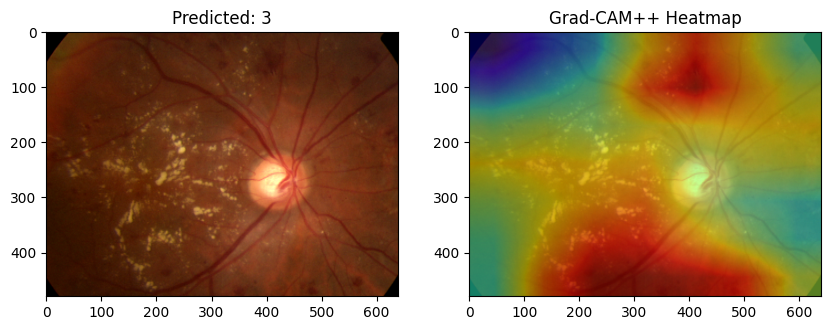

In [7]:
# Loading a test image
test_img_path = "data/aptos2019/test_images/0a2b5e1a0be8.png"
img = Image.open(test_img_path)
img_size = img.size[::-1]

# Preprocessing
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
img_tensor = transform(img).to(device).unsqueeze(0)

# Predicting class
with torch.no_grad():
    output = model(img_tensor)
    pred_class = torch.argmax(output).item()

# Generating Grad-CAM++ heatmap
last_conv=model.features[8][0]
heatmap = grad_cam_plusplus(model, img_tensor.squeeze(0), pred_class, img_size, last_conv)

# Visualizing
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title(f"Predicted: {pred_class}")

plt.subplot(1, 2, 2)
plt.imshow(img)
plt.imshow(heatmap, cmap="jet", alpha=0.5)
plt.title("Grad-CAM++ Heatmap")
plt.show()

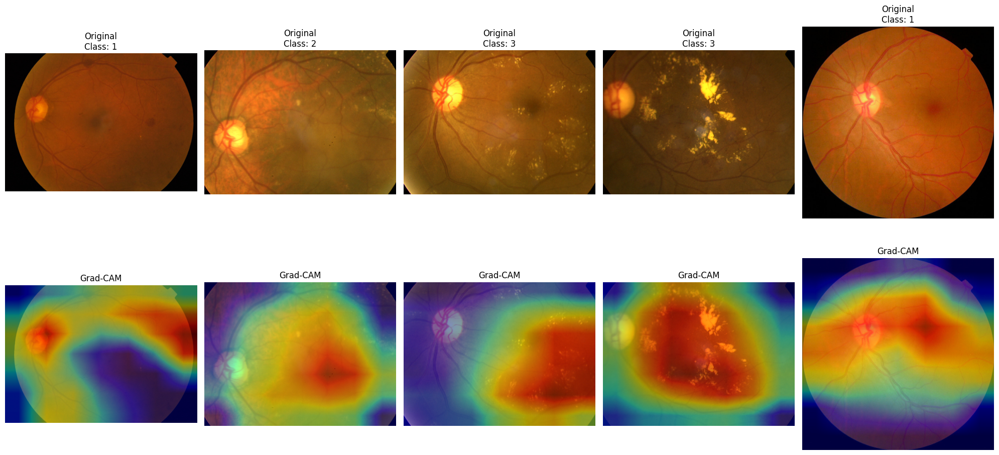

In [8]:
# Plotting predictions and Grad-CAM++ heatmaps
plt.figure(figsize=(20, 10))

for i, img_name in enumerate(selected_images):
    # Loading image
    img_path = os.path.join(image_dir, img_name)
    img = Image.open(img_path)
    img_size = img.size[::-1]
    
    # Preprocessing and predicting
    img_tensor = transform(img).to(device).unsqueeze(0)
    with torch.no_grad():
        output = model(img_tensor)
        pred_class = torch.argmax(output).item()
    
    # Generating Grad-CAM++ heatmap
    last_conv=model.features[8][0]
    heatmap = grad_cam_plusplus(model, img_tensor.squeeze(0), pred_class, img_size, last_conv)
    
    # Plotting original and overlayed images
    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.title(f"Original\nClass: {pred_class}")
    plt.axis('off')
    
    plt.subplot(2, 5, i+6)
    plt.imshow(img)
    plt.imshow(heatmap, cmap="jet", alpha=0.5)
    plt.title("Grad-CAM")
    plt.axis('off')

plt.tight_layout()
plt.show()

## Implementation of X-Grad-CAM

In [9]:
def xgrad_cam(model, img_tensor, target_class, orig_size=(224, 224), last_conv=model.features[-1]):
    # Swithing model to the evaluation mode
    model.eval()
    
    # Moving model and input tensor to the same device
    device = next(model.parameters()).device
    img_tensor = img_tensor.to(device).unsqueeze(0)

    # For tracking gradients
    img_tensor.requires_grad_(True)

    # Getting the last convolutional layer
    last_conv_layer = last_conv
    
    # Storing gradients and activations
    gradients = []
    activations = []

    def backward_hook(module, grad_input, grad_output):
        gradients.append(grad_output[0].detach())

    def forward_hook(module, input, output):
        activations.append(output.detach())

    # Registering hooks to get activations and gradients
    hook_b = last_conv_layer.register_backward_hook(backward_hook)
    hook_f = last_conv_layer.register_forward_hook(forward_hook)

    # Forward pass
    output = model(img_tensor)
    
    # Backward pass
    model.zero_grad()
    one_hot = torch.zeros_like(output)
    one_hot[0, target_class] = 1
    output.backward(gradient=one_hot)

    # XGrad-CAM computation (from the paper)
    grads = gradients[0]
    acts = activations[0]
    
    # Numerator
    numerator = grads * acts
    # Denominator
    epsilon = 1e-7
    denominator = acts.sum(dim=(2, 3), keepdim=True) + epsilon
    
    # Alpha weights for XGrad-CAM (from the paper)
    alpha = numerator / denominator
    alpha = alpha.sum(dim=(2, 3), keepdim=True)
    
    # Weighted combination of activations
    cam = torch.sum(alpha * acts, dim=1, keepdim=True)
    cam = torch.relu(cam)
    
    # Resizing and normalizing
    cam = torch.nn.functional.interpolate(
        cam, size=orig_size, mode="bilinear", align_corners=False
    )

    # Moving to CPU for visualization
    cam = cam.squeeze().cpu().numpy()
    # Normalizing to [0, 1]
    cam = (cam - cam.min()) / (cam.max() - cam.min())

    # Removing hooks
    hook_b.remove()
    hook_f.remove()

    return cam

## Testing X-Grad-CAM

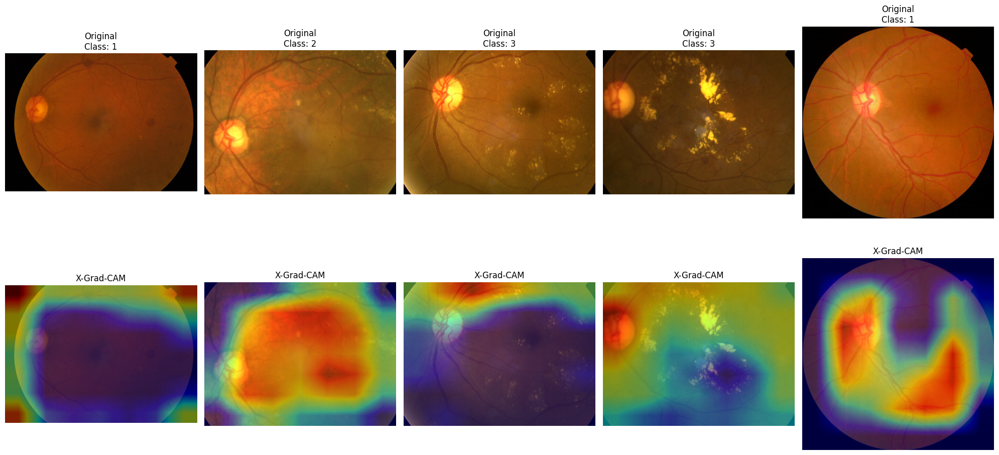

In [10]:
# Plotting predictions and X-Grad-CAM heatmaps
plt.figure(figsize=(20, 10))

for i, img_name in enumerate(selected_images):
    # Loading image
    img_path = os.path.join(image_dir, img_name)
    img = Image.open(img_path)
    img_size = img.size[::-1]
    
    # Preprocessing and predicting
    img_tensor = transform(img).to(device).unsqueeze(0)
    with torch.no_grad():
        output = model(img_tensor)
        pred_class = torch.argmax(output).item()
    
    # Generating X-Grad-CAM heatmap
    last_conv=model.features[8][0]
    heatmap = xgrad_cam(model, img_tensor.squeeze(0), pred_class, img_size, last_conv)
    
    # Plotting original and overlayed images
    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.title(f"Original\nClass: {pred_class}")
    plt.axis('off')
    
    plt.subplot(2, 5, i+6)
    plt.imshow(img)
    plt.imshow(heatmap, cmap="jet", alpha=0.5)
    plt.title("X-Grad-CAM")
    plt.axis('off')

plt.tight_layout()
plt.show()

## Comparing different CAMs

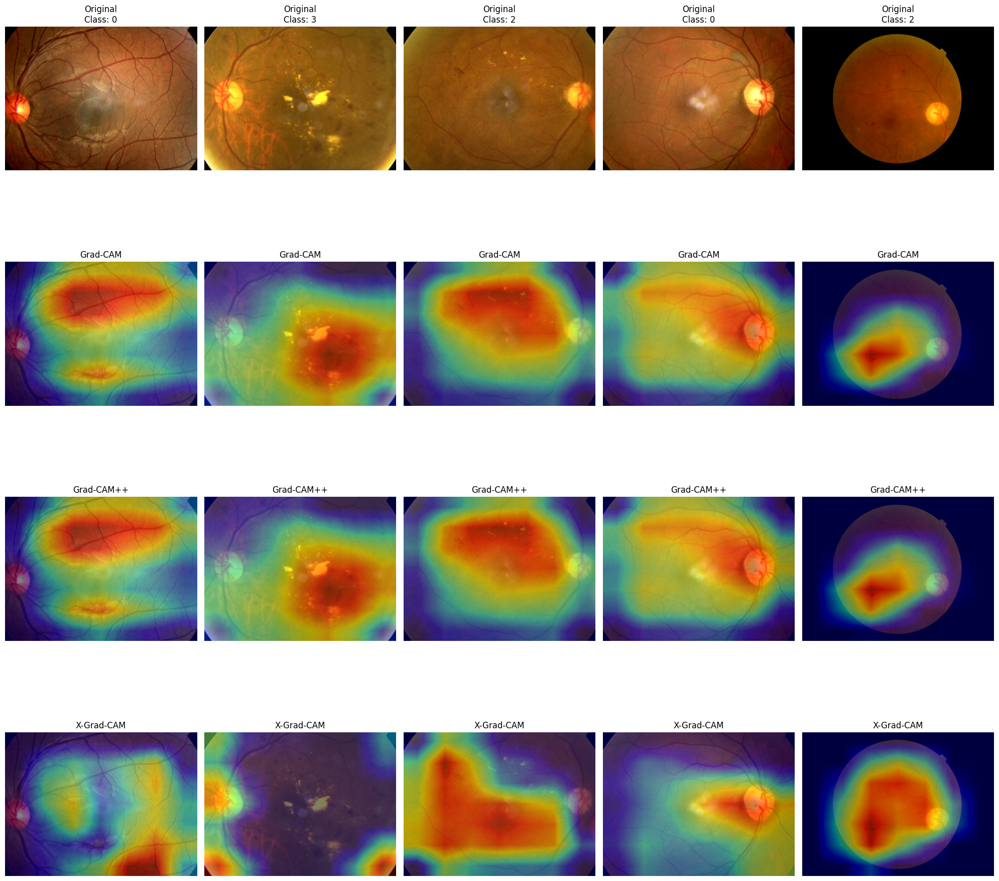

In [11]:
image_dir = "data/aptos2019/test_images"
all_images = os.listdir(image_dir)
# Taking 5 random images
selected_images = random.sample(all_images, 5)

# Plotting predictions and CAMs heatmaps
plt.figure(figsize=(20, 20))

for i, img_name in enumerate(selected_images):
    # Loading image
    img_path = os.path.join(image_dir, img_name)
    img = Image.open(img_path)
    img_size = img.size[::-1]
    
    # Preprocessing and predicting
    img_tensor = transform(img).to(device).unsqueeze(0)
    with torch.no_grad():
        output = model(img_tensor)
        pred_class = torch.argmax(output).item()
    
    # Generating GradCAM, GradCAM++, X-GradCAM heamaps
    last_conv=model.features[8][0]
    cam = grad_cam(model, img_tensor.squeeze(0), pred_class, img_size, last_conv)
    campp = grad_cam_plusplus(model, img_tensor.squeeze(0), pred_class, img_size, last_conv)
    xcam = xgrad_cam(model, img_tensor.squeeze(0), pred_class, img_size, last_conv)
    
    # Plotting original and overlayed images
    plt.subplot(4, 5, i+1)
    plt.imshow(img)
    plt.title(f"Original\nClass: {pred_class}")
    plt.axis('off')
    
    plt.subplot(4, 5, i+6)
    plt.imshow(img)
    plt.imshow(cam, cmap="jet", alpha=0.5)
    plt.title("Grad-CAM")
    plt.axis('off')

    plt.subplot(4, 5, i+11)
    plt.imshow(img)
    plt.imshow(campp, cmap="jet", alpha=0.5)
    plt.title("Grad-CAM++")
    plt.axis('off')

    plt.subplot(4, 5, i+16)
    plt.imshow(img)
    plt.imshow(xcam, cmap="jet", alpha=0.5)
    plt.title("X-Grad-CAM")
    plt.axis('off')

plt.tight_layout()
plt.show()

## Comparison for another model - VGG19

In [12]:
# VGG model architecture

class DRModel(nn.Module):
    def __init__(self, num_classes=5):
        super(DRModel, self).__init__()
        
        # Loading pre-trained VGG19
        self.vgg = models.vgg19(weights='IMAGENET1K_V1')
        
        # Removing the classifier
        self.features = self.vgg.features
        
        # Freezing VGG19 weights
        for param in self.features.parameters():
            param.requires_grad = False
            
        # Additional layers
        self.global_avg_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.flatten = nn.Flatten()
        
        # VGG19 last convolution layer has 512 channels
        self.fc1 = nn.Linear(512, 256)  
        self.dropout = nn.Dropout(0.3)
        self.fc2 = nn.Linear(256, num_classes)
        
        # Activation
        self.elu = nn.ELU()
        
    def forward(self, x):
        # Feature extraction
        x = self.features(x)
        x = self.global_avg_pool(x)
        x = self.flatten(x)
        
        # Classification
        x = self.fc1(x)
        x = self.elu(x)
        x = self.dropout(x)
        x = self.fc2(x)
        
        return x

# Loading fine-tuned weights
model = DRModel(num_classes=5)
model.load_state_dict(torch.load('best_model_vgg.pth'))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()

DRModel(
  (vgg): VGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace=True)
      (16): Co

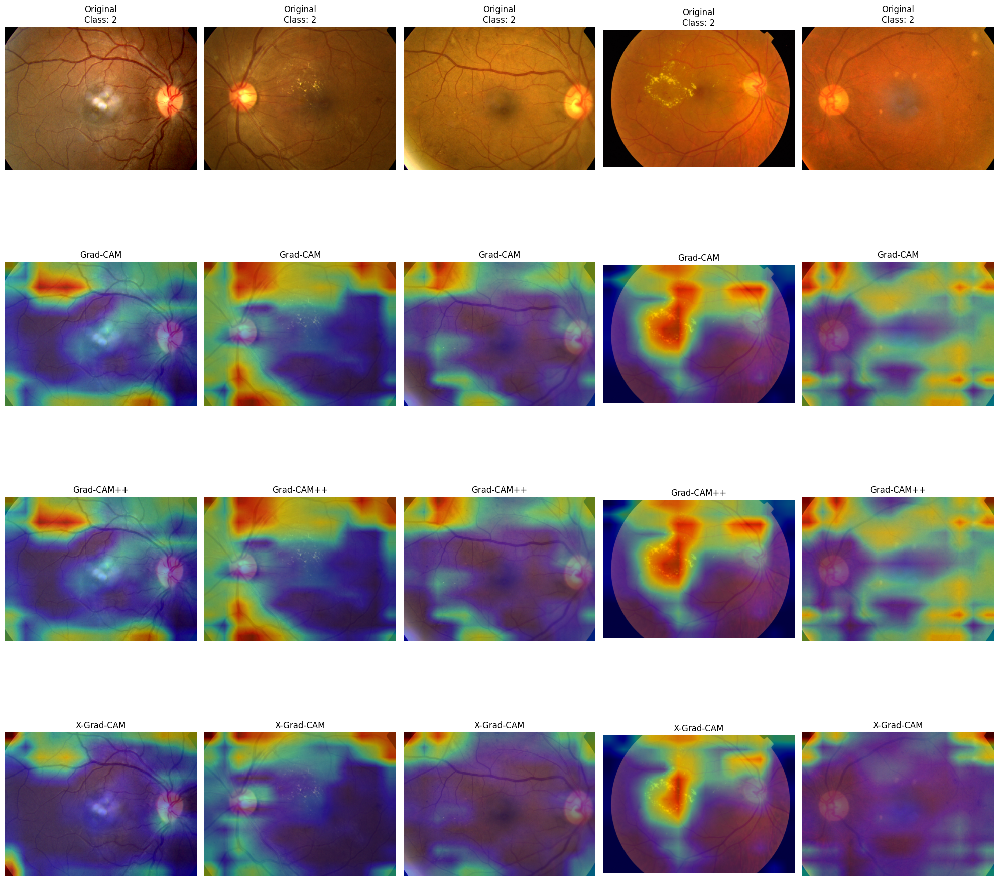

In [13]:
image_dir = "data/aptos2019/test_images"
all_images = os.listdir(image_dir)
# Taking 5 random images
selected_images = random.sample(all_images, 5)

# Plotting predictions and CAMs heatmaps
plt.figure(figsize=(20, 20))

for i, img_name in enumerate(selected_images):
    # Loading image
    img_path = os.path.join(image_dir, img_name)
    img = Image.open(img_path)
    img_size = img.size[::-1]
    
    # Preprocessing and predicting
    img_tensor = transform(img).to(device).unsqueeze(0)
    with torch.no_grad():
        output = model(img_tensor)
        pred_class = torch.argmax(output).item()
    
    # Generating GradCAM, GradCAM++, X-GradCam
    last_conv=model.features[34]
    cam = grad_cam(model, img_tensor.squeeze(0), pred_class, img_size, last_conv)
    campp = grad_cam_plusplus(model, img_tensor.squeeze(0), pred_class, img_size, last_conv)
    xcam = xgrad_cam(model, img_tensor.squeeze(0), pred_class, img_size, last_conv)
    
    # Plotting original and overlayed images
    plt.subplot(4, 5, i+1)
    plt.imshow(img)
    plt.title(f"Original\nClass: {pred_class}")
    plt.axis('off')
    
    plt.subplot(4, 5, i+6)
    plt.imshow(img)
    plt.imshow(cam, cmap="jet", alpha=0.5)
    plt.title("Grad-CAM")
    plt.axis('off')

    plt.subplot(4, 5, i+11)
    plt.imshow(img)
    plt.imshow(campp, cmap="jet", alpha=0.5)
    plt.title("Grad-CAM++")
    plt.axis('off')

    plt.subplot(4, 5, i+16)
    plt.imshow(img)
    plt.imshow(xcam, cmap="jet", alpha=0.5)
    plt.title("X-Grad-CAM")
    plt.axis('off')

plt.tight_layout()
plt.show()